# Data Preparation

## Load skycam images dataframe and weather dataframe

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread

In [19]:
w_data=pd.read_csv("./SkyCam/weatherdata.csv") 

w_data=w_data.drop(columns=["Unnamed: 0"])

w_data["datetime"]=pd.to_datetime(w_data["datetime"])

In [3]:
f_data=pd.read_csv("./SkyCam/fotodata.csv") 

f_data=f_data.drop(columns=["Unnamed: 0"]).dropna()

f_data["datetime"]=pd.to_datetime(f_data["datetime"])

In [21]:
w2_data=pd.read_csv("./SkyCam/otherweatherdata.csv",header=2) 

#w2_data=w_data.drop(columns=["Unnamed: 0"])

#w2_data["datetime"]=pd.to_datetime(w_data["datetime"])
w2_data["time"]=pd.to_datetime(w2_data["time"])
w2_data=w2_data.rename(columns={"time": "datetime"})

## Calculate rainfall per minute and merge w_data and f_data

In [13]:
w_data

,datetime,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm]
0,2018-07-01 00:00:00,6.7,12.7,25,18.4,57,1015.1,9.7,0.0
1,2018-07-01 00:01:00,6.7,12.7,25,18.4,57,1015.1,9.7,0.0
2,2018-07-01 00:02:00,6.1,12.7,50,18.4,57,1015.1,9.7,0.0
3,2018-07-01 00:03:00,5.3,11.5,65,18.4,57,1015.1,9.7,0.0
4,2018-07-01 00:04:00,6.9,10.4,46,18.4,57,1015.1,9.7,0.0
...,...,...,...,...,...,...,...,...,...
2298235,2022-11-12 23:55:00,2.1,2.3,134,11.3,96,1025.4,10.7,0.0
2298236,2022-11-12 23:56:00,2.8,3.5,132,11.3,96,1025.4,10.7,0.0
2298237,2022-11-12 23:57:00,1.6,4.6,151,11.3,96,1025.5,10.7,0.0
2298238,2022-11-12 23:58:00,1.0,2.3,151,11.3,97,1025.5,10.8,0.0


In [22]:
w_data["rainfall per minute [mm/min]"]=w_data["Daily rain total [mm]"].diff()
w_data

,datetime,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min]
0,2018-07-01 00:00:00,6.7,12.7,25,18.4,57,1015.1,9.7,0.0,NaN
1,2018-07-01 00:01:00,6.7,12.7,25,18.4,57,1015.1,9.7,0.0,0.0
2,2018-07-01 00:02:00,6.1,12.7,50,18.4,57,1015.1,9.7,0.0,0.0
3,2018-07-01 00:03:00,5.3,11.5,65,18.4,57,1015.1,9.7,0.0,0.0
4,2018-07-01 00:04:00,6.9,10.4,46,18.4,57,1015.1,9.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2298235,2022-11-12 23:55:00,2.1,2.3,134,11.3,96,1025.4,10.7,0.0,0.0
2298236,2022-11-12 23:56:00,2.8,3.5,132,11.3,96,1025.4,10.7,0.0,0.0
2298237,2022-11-12 23:57:00,1.6,4.6,151,11.3,96,1025.5,10.7,0.0,0.0
2298238,2022-11-12 23:58:00,1.0,2.3,151,11.3,97,1025.5,10.8,0.0,0.0


In [23]:
w_data=w_data.groupby(pd.Grouper(key='datetime', axis=0, freq='5min')).mean()
w_data

,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min]
datetime,,,,,,,,,
2018-07-01 00:00:00,6.34,12.00,42.2,18.40,57.0,1015.10,9.70,0.0,0.0
2018-07-01 00:05:00,5.54,11.02,51.2,18.32,57.8,1014.60,9.86,0.0,0.0
2018-07-01 00:10:00,5.64,10.38,66.0,18.22,58.2,1015.00,9.88,0.0,0.0
2018-07-01 00:15:00,3.78,8.08,47.6,18.20,59.0,1015.04,10.10,0.0,0.0
2018-07-01 00:20:00,2.24,5.76,52.4,18.14,59.2,1015.10,10.08,0.0,0.0
...,...,...,...,...,...,...,...,...,...
2022-11-12 23:35:00,2.08,3.50,135.8,11.18,96.0,1025.56,10.58,0.0,0.0
2022-11-12 23:40:00,1.58,3.02,139.4,11.20,96.0,1025.58,10.60,0.0,0.0
2022-11-12 23:45:00,2.30,3.26,131.2,11.22,96.0,1025.48,10.62,0.0,0.0


In [24]:
data=w_data.merge(f_data, on='datetime')
data

,datetime,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min],azimuth,altitude,URL,foto_filepath
0,2018-07-01 05:45:00,2.20,4.18,56.0,14.86,80.0,1014.50,11.46,0.0,0.0,-2.287548,-0.020277,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0545.jpg
1,2018-07-01 05:50:00,1.36,3.24,59.0,15.04,79.2,1014.50,11.48,0.0,0.0,-2.270338,-0.009968,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0550.jpg
2,2018-07-01 06:00:00,2.20,5.08,62.6,15.38,78.4,1014.50,11.66,0.0,0.0,-2.236194,0.011095,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0600.jpg
3,2018-07-01 06:10:00,3.32,6.00,49.6,15.80,76.8,1014.44,11.76,0.0,0.0,-2.202399,0.032729,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0610.jpg
4,2018-07-01 06:15:00,1.56,3.96,62.0,15.94,76.0,1014.50,11.74,0.0,0.0,-2.185626,0.043749,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0615.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144584,2022-11-12 14:55:00,3.80,6.92,150.6,15.38,84.0,1026.76,12.68,0.0,0.0,0.559016,0.265583,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1455.jpg
144585,2022-11-12 15:00:00,2.98,4.18,147.0,15.30,84.0,1026.76,12.60,0.0,0.0,0.579151,0.258252,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1500.jpg
144586,2022-11-12 15:05:00,5.82,8.32,136.8,15.30,84.0,1026.70,12.60,0.0,0.0,0.599156,0.250692,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1505.jpg
144587,2022-11-12 15:10:00,4.50,8.08,148.4,15.30,84.0,1026.74,12.60,0.0,0.0,0.619030,0.242909,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1510.jpg


## Remove images with scaffolding, remove images with zero wind difference

In [25]:
data[data["datetime"]=="2019-04-09 13:00:00"] # Index 21212
data[data["datetime"]=="2019-06-15 08:20:00"] # Index 28355
data=data.drop(data.index[21212:28355])

In [26]:
data[data["Wind direction [degrees]"]==0]
data["diff 10-min wind speed [mph]"]=data["10-min wind speed [mph]"].diff()
data["diff Max Gust [mph]"]=data["10-min wind speed [mph]"].diff()

In [27]:
data=data[data["diff 10-min wind speed [mph]"]!=0].drop(columns=["diff 10-min wind speed [mph]","diff Max Gust [mph]"])

In [11]:
len(data)

131498

In [28]:
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_rows',10)
data_rain=data[data["rainfall per minute [mm/min]"]>0]
data_no_rain=data[data["rainfall per minute [mm/min]"]==0]
#data_rain=data_rain[data_rain["rainfall per minute [mm/min]"]<0.3]

In [13]:
len(data_no_rain)

94548

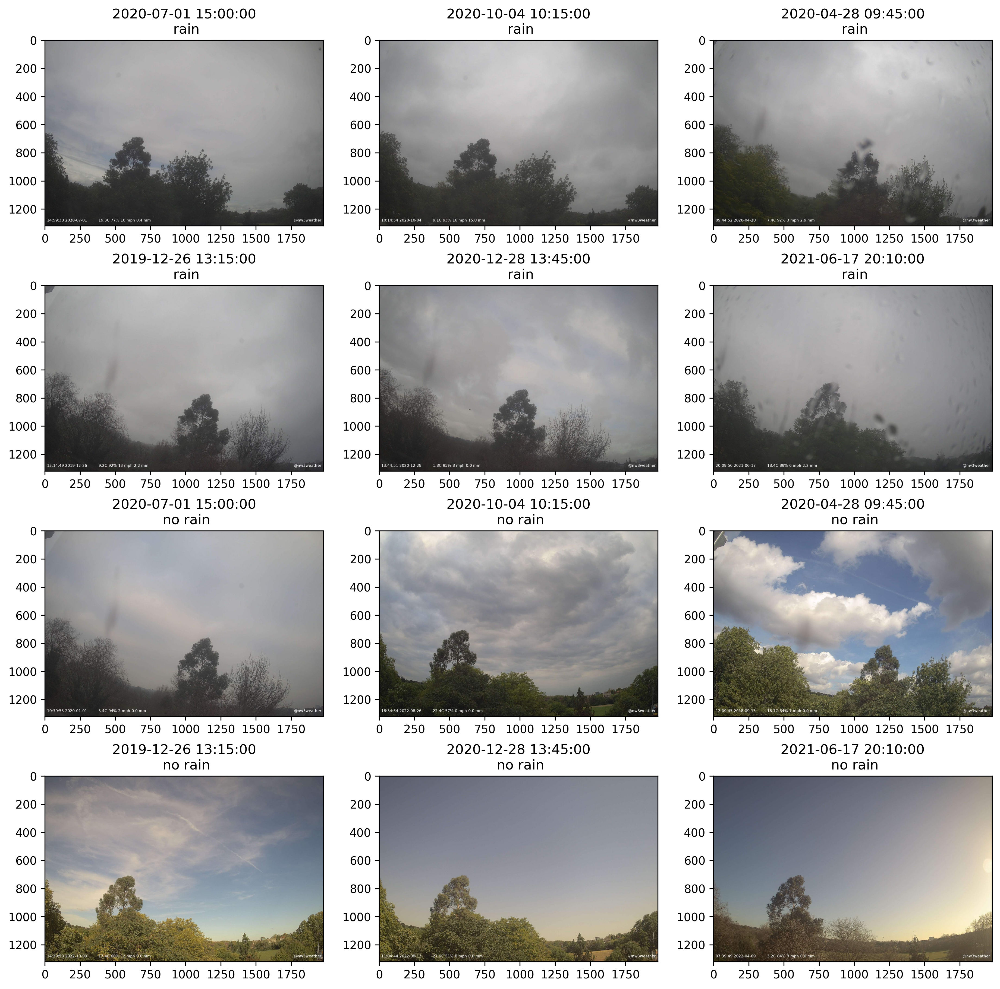

In [17]:
plt.figure(figsize=(15, 15), dpi=300)
tmp=data_rain.sample(6)
tmp2=data_no_rain.sample(6)
for k in range(6):
    plt.subplot(4,3,k+1)
    plt.imshow(plt.imread(tmp.iloc[k,-1]))
    plt.title(str(tmp.iloc[k,0]) +"\n rain")
    plt.subplot(4,3,k+7)
    plt.imshow(plt.imread(tmp2.iloc[k,-1]))
    plt.title(str(tmp.iloc[k,0]) +"\n no rain")
plt.show()

In [51]:
data_rain.sort_values(by="rainfall per minute [mm/min]", ascending = False)

,datetime,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min],azimuth,altitude,URL,foto_filepath
134560,2022-08-17 15:00:00,4.4,8.0,21,20.2,87,1013.4,18.0,16.1,1.5,0.370385,0.878831,http://nw3weather.co.uk/camchive/hik/2022/08/1...,./SkyCam/2022_08_17_1500.jpg
134559,2022-08-17 14:55:00,9.6,14.8,13,20.7,86,1013.4,18.3,10.8,1.0,0.337867,0.883559,http://nw3weather.co.uk/camchive/hik/2022/08/1...,./SkyCam/2022_08_17_1455.jpg
137465,2022-09-06 17:00:00,10.3,19.6,240,20.1,81,1011.6,16.7,1.4,0.9,0.974120,0.551395,http://nw3weather.co.uk/camchive/hik/2022/09/0...,./SkyCam/2022_09_06_1700.jpg
57971,2020-06-06 17:45:00,9.4,11.5,300,12.1,72,1001.0,7.2,5.3,0.9,1.365168,0.669417,http://nw3weather.co.uk/camchive/hik/2020/06/0...,./SkyCam/2020_06_06_1745.jpg
3074,2018-07-27 18:10:00,9.4,18.4,239,24.6,73,1008.9,19.4,3.4,0.8,1.380839,0.577307,http://nw3weather.co.uk/camchive/hik/2018/07/2...,./SkyCam/2018_07_27_1810.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39794,2019-10-01 17:30:00,1.8,3.5,306,14.3,90,999.3,12.7,13.0,0.2,1.035037,0.321360,http://nw3weather.co.uk/camchive/hik/2019/10/0...,./SkyCam/2019_10_01_1730.jpg
41442,2019-10-24 16:15:00,4.7,9.2,261,11.0,92,1005.3,9.8,8.6,0.2,0.680953,0.331886,http://nw3weather.co.uk/camchive/hik/2019/10/2...,./SkyCam/2019_10_24_1615.jpg
39793,2019-10-01 17:20:00,1.2,3.5,293,14.4,89,999.1,12.6,12.6,0.2,0.995950,0.344480,http://nw3weather.co.uk/camchive/hik/2019/10/0...,./SkyCam/2019_10_01_1720.jpg
93907,2021-07-25 17:15:00,3.1,5.7,30,17.7,93,1009.3,16.6,33.8,0.2,1.165202,0.725146,http://nw3weather.co.uk/camchive/hik/2021/07/2...,./SkyCam/2021_07_25_1715.jpg


In [30]:
data_no_rain.sample(5000)

,datetime,10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min],azimuth,altitude,URL,foto_filepath
39885,2019-10-06 11:40:00,5.62,10.60,291.2,14.80,80.6,1009.84,11.52,13.8,0.0,-0.642173,0.473957,http://nw3weather.co.uk/camchive/hik/2019/10/0...,./SkyCam/2019_10_06_1140.jpg
54544,2020-05-09 12:40:00,6.30,8.08,107.8,23.24,41.0,1013.76,9.22,0.0,0.0,-0.548175,0.918821,http://nw3weather.co.uk/camchive/hik/2020/05/0...,./SkyCam/2020_05_09_1240.jpg
12707,2018-11-23 13:15:00,3.30,6.24,96.2,7.50,92.0,1014.16,6.30,0.0,0.0,0.118744,0.312593,http://nw3weather.co.uk/camchive/hik/2018/11/2...,./SkyCam/2018_11_23_1315.jpg
16531,2019-02-06 15:15:00,4.96,8.32,211.0,10.40,78.2,1016.20,6.74,1.6,0.0,0.529894,0.312467,http://nw3weather.co.uk/camchive/hik/2019/02/0...,./SkyCam/2019_02_06_1515.jpg
119233,2022-05-05 13:10:00,3.78,6.16,339.6,17.20,65.8,1025.38,10.76,0.0,0.0,-0.339285,0.932763,http://nw3weather.co.uk/camchive/hik/2022/05/0...,./SkyCam/2022_05_05_1310.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72733,2020-11-13 15:10:00,6.64,9.12,241.8,11.70,74.8,1013.58,7.36,0.4,0.0,0.615189,0.236779,http://nw3weather.co.uk/camchive/hik/2020/11/1...,./SkyCam/2020_11_13_1510.jpg
108822,2022-02-12 10:00:00,11.90,17.80,224.8,6.30,75.0,1024.30,2.20,0.0,0.0,-0.844673,0.213514,http://nw3weather.co.uk/camchive/hik/2022/02/1...,./SkyCam/2022_02_12_1000.jpg
102045,2021-10-29 10:10:00,8.66,13.90,207.0,13.80,88.0,997.16,11.80,2.4,0.0,-0.920885,0.177549,http://nw3weather.co.uk/camchive/hik/2021/10/2...,./SkyCam/2021_10_29_1010.jpg
42976,2019-11-24 09:30:00,0.00,0.00,110.0,8.30,96.0,1004.68,7.70,0.2,0.0,-0.796991,0.106464,http://nw3weather.co.uk/camchive/hik/2019/11/2...,./SkyCam/2019_11_24_0930.jpg


In [166]:
import shutil

for k in range(len(data_rain)):
    shutil.copyfile(data_rain.iloc[k,-1], "./SkyCam/rain/"+data_rain.iloc[k,-1][9:])

In [33]:
import shutil
sample=data_no_rain.sample(5000)
for k in range(len(sample)):
    shutil.copyfile(sample.iloc[k,-1], "./SkyCam/no_rain/"+sample.iloc[k,-1][9:])

## Merge second weather data set with data frame

In [15]:
w_data=w_data.reset_index()

In [16]:
w_data_h=w_data.groupby(pd.Grouper(key='datetime', axis=0, freq='1H')).mean().reset_index()

In [17]:
pd.set_option('display.max_rows', 10)
data_hour=w2_data.merge(data, on='datetime')
data_rain=data_hour[data_hour["precipitation (mm)"]==0]

In [250]:
data_hour

,datetime,temperature_2m (°C),dewpoint_2m (°C),surface_pressure (hPa),precipitation (mm),windspeed_10m (km/h),windgusts_10m (km/h),10-min wind speed [mph],Max Gust [mph],Wind direction [degrees],Temperature [°C],Relative humidity [%],Pressure [hPa],Dew Point [C],Daily rain total [mm],rainfall per minute [mm/min],azimuth,altitude,URL,foto_filepath
0,2018-07-01 06:00:00,17.2,12.3,1005.2,0.0,12.5,24.1,2.20,5.08,62.6,15.38,78.4,1014.50,11.66,0.0,0.0,-2.236194,0.011095,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0600.jpg
1,2018-07-01 07:00:00,19.1,12.6,1005.0,0.0,13.4,26.6,1.66,3.02,37.2,17.40,72.4,1014.50,12.38,0.0,0.0,-2.037814,0.148396,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0700.jpg
2,2018-07-01 08:00:00,21.6,13.3,1005.3,0.0,13.9,31.0,5.76,9.66,71.8,19.52,65.2,1014.36,12.78,0.0,0.0,-1.845920,0.299969,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0800.jpg
3,2018-07-01 09:00:00,23.6,13.8,1005.0,0.0,14.5,33.1,5.88,10.36,66.2,21.66,58.2,1014.40,13.10,0.0,0.0,-1.652086,0.460002,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_0900.jpg
4,2018-07-01 10:00:00,25.2,13.1,1005.2,0.0,14.6,35.6,3.42,5.78,45.0,23.86,54.0,1014.44,13.96,0.0,0.0,-1.444503,0.622557,http://nw3weather.co.uk/camchive/hik/2018/07/0...,./SkyCam/2018_07_01_1000.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14955,2022-11-12 11:00:00,13.5,12.0,1019.1,0.0,11.4,24.5,3.70,5.32,162.2,13.86,89.0,1028.78,12.06,0.0,0.0,-0.456946,0.299244,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1100.jpg
14956,2022-11-12 12:00:00,14.5,12.5,1018.7,0.0,11.8,26.6,3.38,5.32,187.4,14.64,87.8,1027.96,12.62,0.0,0.0,-0.199483,0.351599,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1200.jpg
14957,2022-11-12 13:00:00,15.4,12.6,1018.1,0.0,12.1,28.1,2.64,5.10,192.8,15.24,86.0,1027.62,12.94,0.0,0.0,0.066531,0.362233,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1300.jpg
14958,2022-11-12 14:00:00,15.7,12.6,1017.6,0.0,12.3,27.0,3.56,5.54,180.4,15.58,85.0,1027.00,13.08,0.0,0.0,0.329493,0.329961,http://nw3weather.co.uk/camchive/hik/2022/11/1...,./SkyCam/2022_11_12_1400.jpg


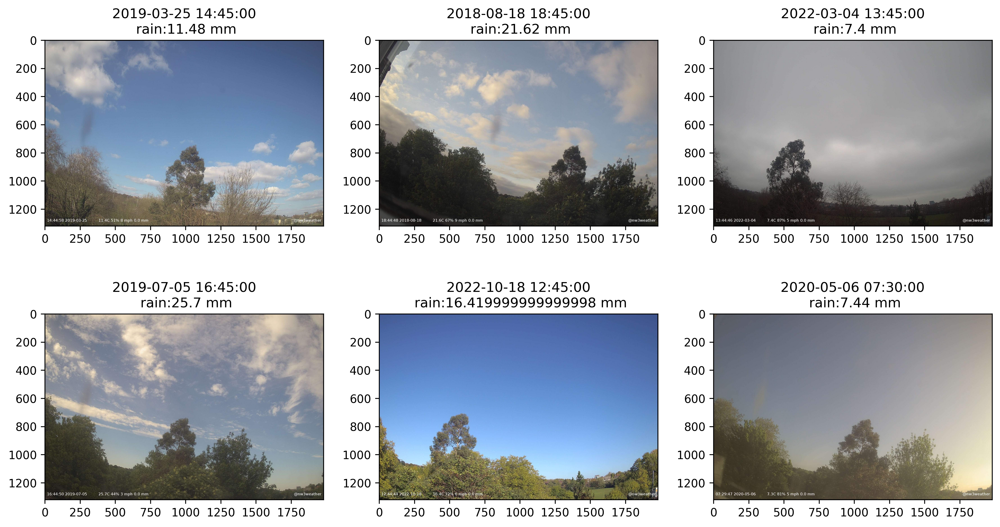

In [40]:
plt.figure(figsize=(15, 8), dpi=300)
tmp=data_rain.sample(6)
for k in range(6):
    plt.subplot(2,3,k+1)
    plt.imshow(plt.imread(tmp.iloc[k,-1]))
    plt.title(str(tmp.iloc[k,0]) +"\n rain:"+str(tmp.iloc[k,4])+" mm")
plt.show()

## Upload Pictures to Bucket

In [4]:
f_data.iloc[0,-1][2:]

'SkyCam/2018_07_01_0545.jpg'

In [4]:
from google.cloud import storage
import time
start = time.time()

BUCKET_NAME='le-wagon-project'

for k in range(144588,144590,1): # last index: 109999

    try:
        storage_filename = f_data.iloc[k,-1][2:]
        local_filename = f_data.iloc[k,-1]

        client = storage.Client()
        bucket = client.bucket(BUCKET_NAME)
        blob = bucket.blob(storage_filename)
        blob.upload_from_filename(local_filename)
        print(f"{100*(k)/len(f_data)}% hochgeladen (Index: {k})...", end='\r')
    except:
        #time.sleep(600)
        storage_filename = f_data.iloc[k,-1][2:]
        local_filename = f_data.iloc[k,-1]

        client = storage.Client()
        bucket = client.bucket(BUCKET_NAME)
        blob = bucket.blob(storage_filename)
        blob.upload_from_filename(local_filename)
        print(f"{100*(k)/len(f_data)}% hochgeladen (Index: {k})...", end='\r')


dur=time.time() - start

IndexError: index 144589 is out of bounds for axis 0 with size 144589

144589

Copying gs://le-wagon-project/RainImages_Ready/.DS_Store...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_13_1915.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_27_1810.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_27_1620.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_13_1920.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0845.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0900.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0915.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0930.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_27_1815.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0820.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0750.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_31_0640.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2018_07_29_0940.jpg.

Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1210.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1200.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1215.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1220.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1230.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_01_1240.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_09_1240.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_09_1245.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_09_1250.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_10_1515.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_10_1520.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2018_11_12_1330.jpg...           
Copying gs://le-wagon-projec

Copying gs://le-wagon-project/RainImages_Ready/2019_07_19_1200.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_20_0630.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2019_07_20_0650.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_20_0700.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_26_0930.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_26_1145.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_27_1010.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_27_0645.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_30_0940.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_30_1015.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_30_1115.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_07_30_1230.jpg...
Copying gs://le-wagon-project/RainImages_Ready/201

Copying gs://le-wagon-project/RainImages_Ready/2019_10_01_1530.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_07_1045.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_08_1120.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_07_1645.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_1130.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_11_0950.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_1045.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_08_1545.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_0945.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_1145.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_1245.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_10_12_1310.jpg...           
Copying gs://le-wagon-project/RainImage

Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1310.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1315.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1240.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1250.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1330.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_26_1320.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2019_12_31_1300.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2020_01_09_1500.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2020_01_03_0910.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2020_01_09_1510.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2020_01_14_1045.jpg...           
Copying gs://le-wagon-project/RainImages_Ready/2020_01_14_1115.jpg...           
Copying gs://le-wagon-projec

Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1450.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1510.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1515.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1650.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1750.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_04_30_1645.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_05_01_1150.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_05_01_1420.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_06_10_1610.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_05_01_1815.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/2020_06_06_1330.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2020_05_01_1810.jpg...00:13      
Copying gs://le-wagon-project/RainImages_Ready/202

Copying gs://le-wagon-project/RainImages_Ready/2020_09_23_1750.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_09_23_1745.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2020_09_24_1415.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_09_29_0810.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_09_29_0900.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0810.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0820.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0830.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0840.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0850.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0900.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/2020_10_04_0910.jpg...00:10      
Copying gs://le-wagon-project/RainImages_Ready/202

Copying gs://le-wagon-project/RainImages_Ready/2020_12_13_0915.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_13_0930.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_13_1015.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_13_1130.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2020_12_14_1310.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_14_1340.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_14_1350.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_14_1400.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_14_1410.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_18_1230.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_18_1250.jpg...00:09      
Copying gs://le-wagon-project/RainImages_Ready/2020_12_19_1340.jpg...00:09      
Copying gs://le-wagon-project/RainImage

Copying gs://le-wagon-project/RainImages_Ready/2021_05_19_0620.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_05_17_1930.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_05_19_0645.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_19_0710.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_19_0750.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_19_0810.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_21_1245.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_21_1520.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_22_1950.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_22_0600.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_23_1130.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/2021_05_23_1215.jpg...00:08      
Copying gs://le-wagon-project/RainImages_Ready/202

Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_0900.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_0910.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_0945.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_0930.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_1015.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_1020.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_1145.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_1030.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_14_1230.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_19_1345.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_19_1340.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_19_1350.jpg...00:07      
Copying gs://le-wagon-project/RainImages_Ready/2021_09_19_1430.jpg...00:

Copying gs://le-wagon-project/RainImages_Ready/2022_01_04_1200.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_04_1040.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_04_1130.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1030.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_0915.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1000.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_0940.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1115.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1125.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1045.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1155.jpg...:00:06     
Copying gs://le-wagon-project/RainImages_Ready/2022_01_08_1105.jpg...:00:06     
Copying gs://le-wagon-project/RainImage

Copying gs://le-wagon-project/RainImages_Ready/2022_03_11_1505.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_11_1520.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_11_1610.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_13_1130.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1405.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1045.jpg...:00:04     
Copying gs://le-wagon-project/RainImages_Ready/2022_03_13_1150.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1510.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1605.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_13_1305.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1500.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1550.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_03_16_1525.jpg...
Copying gs://le-wagon-pr

Copying gs://le-wagon-project/RainImages_Ready/2022_08_16_1210.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_16_1215.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_08_16_1220.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_16_1225.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_16_1315.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1415.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1430.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1440.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1435.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1425.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1455.jpg...:00:03     
Copying gs://le-wagon-project/RainImages_Ready/2022_08_17_1450.jpg...:00:03     
Copying gs://le-wagon-project/RainImage

Copying gs://le-wagon-project/RainImages_Ready/2022_09_13_1815.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_13_1730.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1145.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1140.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1150.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1220.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1605.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_27_1610.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_30_1610.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_30_1615.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_30_1625.jpg...:00:02     
Copying gs://le-wagon-project/RainImages_Ready/2022_09_30_1630.jpg...
Copying gs://le-wagon-project/RainImage

Copying gs://le-wagon-project/RainImages_Ready/2022_11_07_1030.jpg...:00:01     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_07_1100.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_11_07_1305.jpg...:00:01     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_07_1410.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_07_1310.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1320.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1325.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1455.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1335.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1400.jpg...:00:00     
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1450.jpg...
Copying gs://le-wagon-project/RainImages_Ready/2022_11_08_1340.jpg...
| [1.5k/1.5k files][186.5 MiB/186.5 MiB] 100% Done   8.4 MiB/s ETA 00:00